# Imports & file locations

In [92]:
%load_ext autoreload
%autoreload 2

import itertools
import re

import numpy as np
import scanpy 
import scanpy as sc
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from adjustText import adjust_text
import ternary


from tqdm import tqdm
from sklearn.metrics import normalized_mutual_info_score

import anndata

# Olga's modules
import xspecies

pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

# From https://pandas.pydata.org/pandas-docs/stable/user_guide/advanced.html
# You can use pandas.IndexSlice to facilitate a more natural syntax using :, rather than using slice(None).
idx = pd.IndexSlice


anndata.__version__

scanpy.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
scanpy.logging.print_versions()
scanpy.set_figure_params(frameon=False, color_map='magma_r')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
scanpy==1.4.6.dev9+ge632939 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.22 statsmodels==0.10.2 python-igraph==0.7.1 louvain==0.6.1


In [2]:
indir_local = '/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/'

In [3]:
outdir_gdrive = '/home/olga/googledrive/TabulaMicrocebus/data/cross-species/correlation'
outdir_local = '/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species/correlation'
outdirs = outdir_local, outdir_gdrive
# for d in outdirs:
#     ! mkdir -p $d
# !ls -lha $outdir_local

# Load data

In [4]:
%%time
h5ad = f'{indir_local}/concatenated__human-lung--lemur-lung--mouse-lung__10x__one2one_orthologs__unified_compartments__bbknn.h5ad'
adata = scanpy.read_h5ad(h5ad)
adata

adata.obs = adata.obs.replace('nan', np.nan)

## Add compartment_narrow

adata.obs['compartment_narrow'] = adata.obs['compartment_group'].astype(str) + ': ' + adata.obs['narrow_group'].astype(str)
adata.obs['compartment_narrow'].value_counts().sort_index()

CPU times: user 596 ms, sys: 638 ms, total: 1.23 s
Wall time: 7.11 s


endothelial: Artery                                  791
endothelial: Bronchial Vessel                        319
endothelial: CX3CL1+ Capillary                         4
endothelial: Capillary                              2130
endothelial: Capillary Aerocyte                     1634
endothelial: Capillary Intermediate                  561
endothelial: Lymphatic                               386
endothelial: Uknown Endothelial                      665
endothelial: Undistinguished Endothelial              32
endothelial: Vein                                    683
epithelial: Alveolar Epithelial Type 1               599
epithelial: Alveolar Epithelial Type 2              4266
epithelial: Basal                                    705
epithelial: Ciliated                                1303
epithelial: Club                                     567
epithelial: Goblet                                   138
epithelial: Ionocyte                                  18
epithelial: Mucous             

## only use narrow groups that are shared across all

In [5]:
adata_same_narrow_group = adata[adata.obs.groupby('narrow_group').filter(lambda x: x.species.nunique() == 3).index]
adata_same_narrow_group

View of AnnData object with n_obs × n_vars = 43114 × 11761 
    obs: 'age', 'batch', 'cell', 'cell_barcode', 'cell_ontology_class', 'cell_ontology_id', 'channel', 'channel_no_10x', 'channel_tissue', 'compartment', 'compartment_id', 'free_annotation', 'individual', 'location', 'magnetic.selection', 'method', 'mouse.id', 'nGene', 'nUMI', 'n_barcodes', 'n_counts', 'n_genes', 'orig.ident', 'original_channel', 'patient', 'percent.ribo', 'possibly_contaminated_barcode', 'preparation.site', 'region', 'sample', 'sequencing_run', 'sex', 'species', 'species_batch', 'species_latin', 'subtissue', 'tissue', 'tissue_free_annotation', 'compartment_updated_from_human', 'compartment_updated_from_human__with_species', 'compartment_updated_from_lemur', 'compartment_updated_from_lemur__with_species', 'narrow_group', 'broad_group', 'compartment_group', 'log_counts', 'sqrt_counts', 'compartment_narrow'
    var: 'mouse_lemur__gene_name', 'mouse_lemur_to_human__homology_type', 'human_to_mouse__homology_type',

In [6]:
n_celltype_per_species = adata_same_narrow_group.obs.groupby(['compartment_narrow', 'species']).size()

for d in outdirs:
    n_celltype_per_species.to_excel(f'{d}/n_celltypes_per_species.xlsx')

In [7]:
min_cells_per_group = 20
groupby = ['compartment_narrow', 'species']
df = adata_same_narrow_group.obs.groupby(groupby).filter(lambda x: len(x) >= min_cells_per_group)
df = df.groupby('compartment_narrow').filter(lambda x: x['species'].nunique() == 3)
print(df.compartment_narrow.nunique())
df.groupby(groupby).size()

14


compartment_narrow                      species    
endothelial: Capillary                  Human            842
                                        Mouse           1244
                                        Mouse lemur       44
endothelial: Capillary Aerocyte         Human           1047
                                        Mouse            476
                                        Mouse lemur      111
endothelial: Lymphatic                  Human            286
                                        Mouse             32
                                        Mouse lemur       68
epithelial: Alveolar Epithelial Type 2  Human           3427
                                        Mouse            107
                                        Mouse lemur      732
lymphoid: CD4+ T                        Human            332
                                        Mouse             75
                                        Mouse lemur       37
lymphoid: Natural Killer         

In [8]:
adata_min_cells = adata[df.index]
adata_min_cells

View of AnnData object with n_obs × n_vars = 39053 × 11761 
    obs: 'age', 'batch', 'cell', 'cell_barcode', 'cell_ontology_class', 'cell_ontology_id', 'channel', 'channel_no_10x', 'channel_tissue', 'compartment', 'compartment_id', 'free_annotation', 'individual', 'location', 'magnetic.selection', 'method', 'mouse.id', 'nGene', 'nUMI', 'n_barcodes', 'n_counts', 'n_genes', 'orig.ident', 'original_channel', 'patient', 'percent.ribo', 'possibly_contaminated_barcode', 'preparation.site', 'region', 'sample', 'sequencing_run', 'sex', 'species', 'species_batch', 'species_latin', 'subtissue', 'tissue', 'tissue_free_annotation', 'compartment_updated_from_human', 'compartment_updated_from_human__with_species', 'compartment_updated_from_lemur', 'compartment_updated_from_lemur__with_species', 'narrow_group', 'broad_group', 'compartment_group', 'log_counts', 'sqrt_counts', 'compartment_narrow'
    var: 'mouse_lemur__gene_name', 'mouse_lemur_to_human__homology_type', 'human_to_mouse__homology_type',

Trying to set attribute `.obs` of view, copying.


compartment_narrow                      species    
endothelial: Capillary                  Mouse           1244
                                        Mouse lemur       44
                                        Human            842
endothelial: Capillary Aerocyte         Mouse            476
                                        Mouse lemur      111
                                        Human           1047
endothelial: Lymphatic                  Mouse             32
                                        Mouse lemur       68
                                        Human            286
epithelial: Alveolar Epithelial Type 2  Mouse            107
                                        Mouse lemur      732
                                        Human           3427
lymphoid: CD4+ T                        Mouse             75
                                        Mouse lemur       37
                                        Human            332
lymphoid: Natural Killer         

Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2471
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


... storing 'compartment_narrow' as categorical


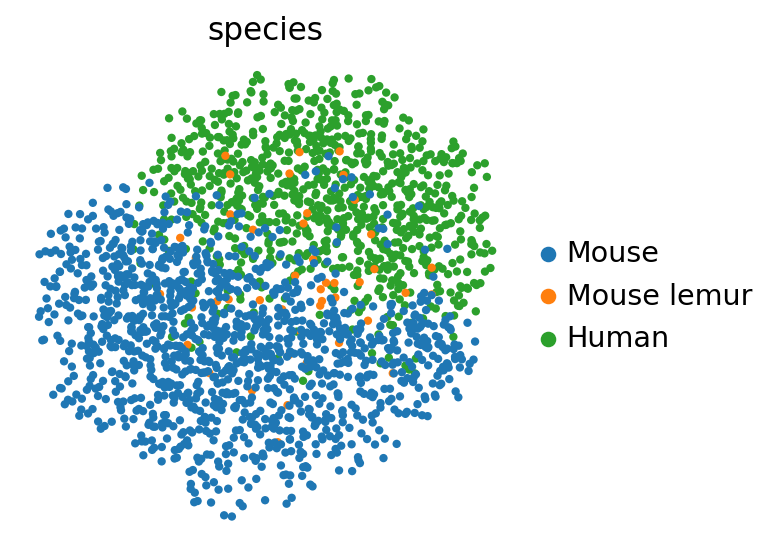


------- group: endothelial: Capillary Aerocyte -------
number of cells: 1634
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2454
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


... storing 'compartment_narrow' as categorical


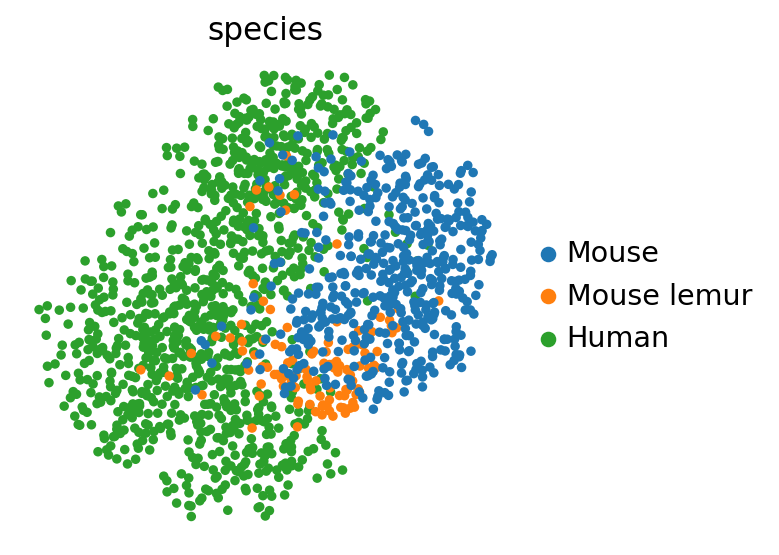


------- group: endothelial: Lymphatic -------
number of cells: 386
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:03)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


... storing 'compartment_narrow' as categorical


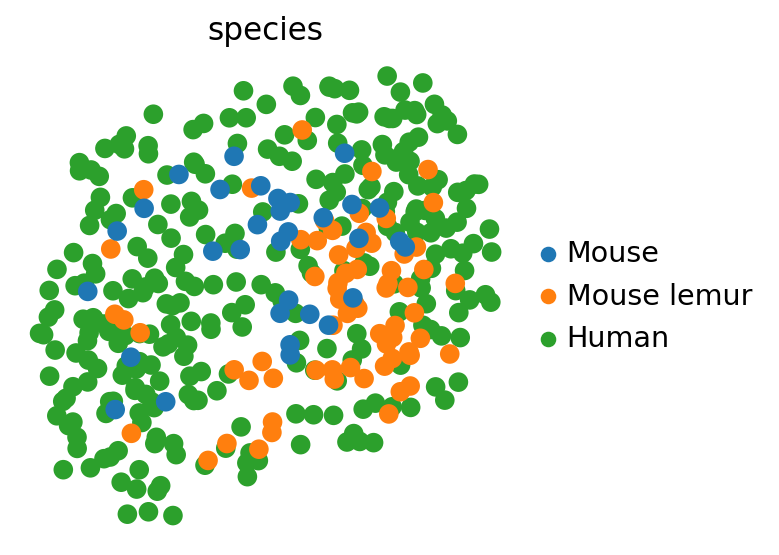


------- group: epithelial: Alveolar Epithelial Type 2 -------
number of cells: 4266
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2769
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


... storing 'compartment_narrow' as categorical


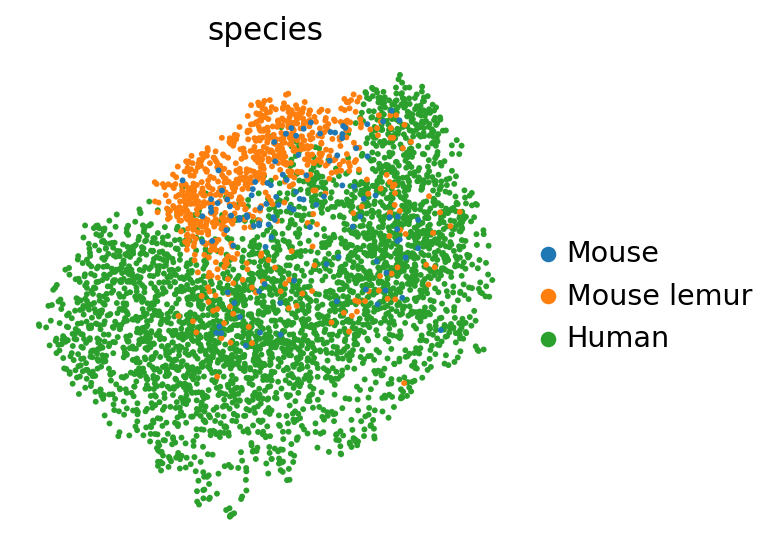


------- group: lymphoid: CD4+ T -------
number of cells: 444
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:02)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


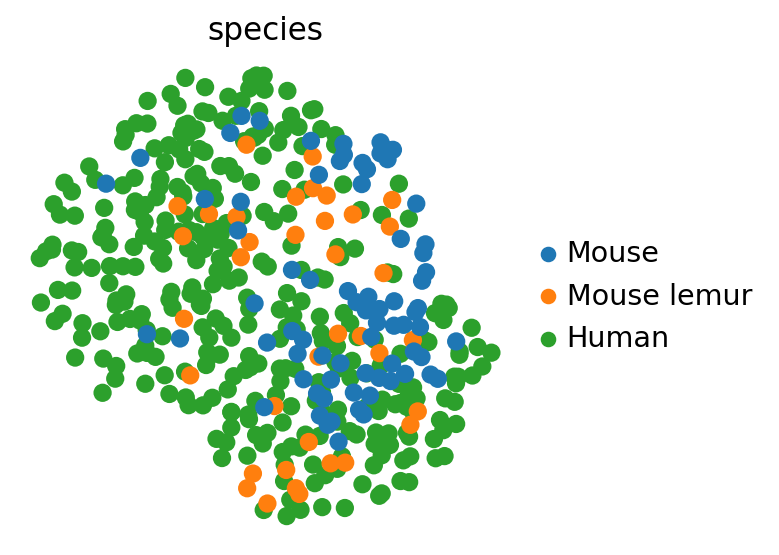


------- group: lymphoid: Natural Killer -------
number of cells: 770
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:04)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


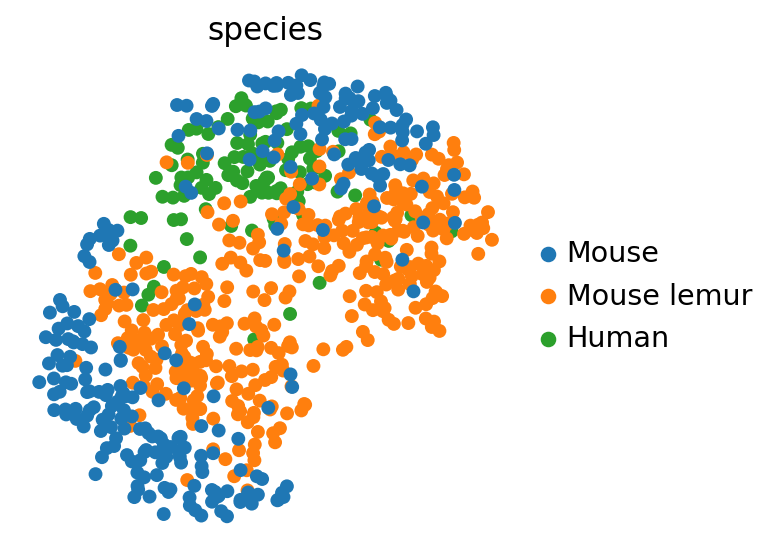


------- group: lymphoid: Plasma -------
number of cells: 249
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


... storing 'compartment_narrow' as categorical


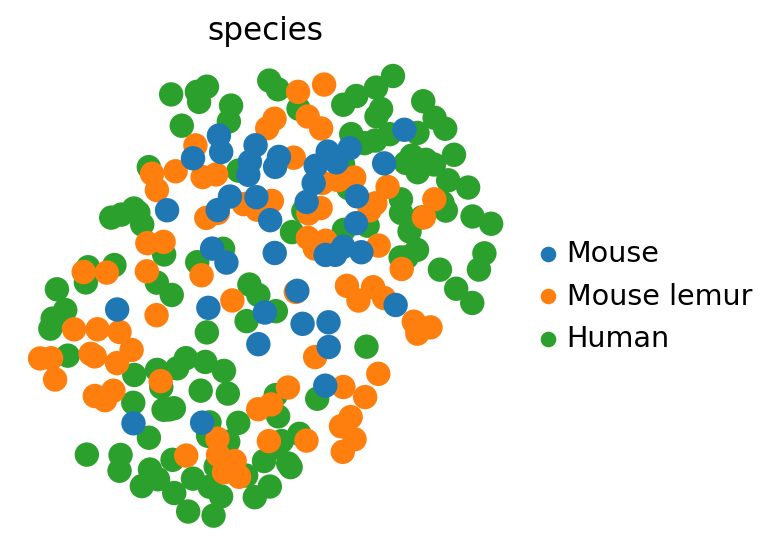


------- group: lymphoid: Proliferating NK/T -------
number of cells: 512
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:03)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


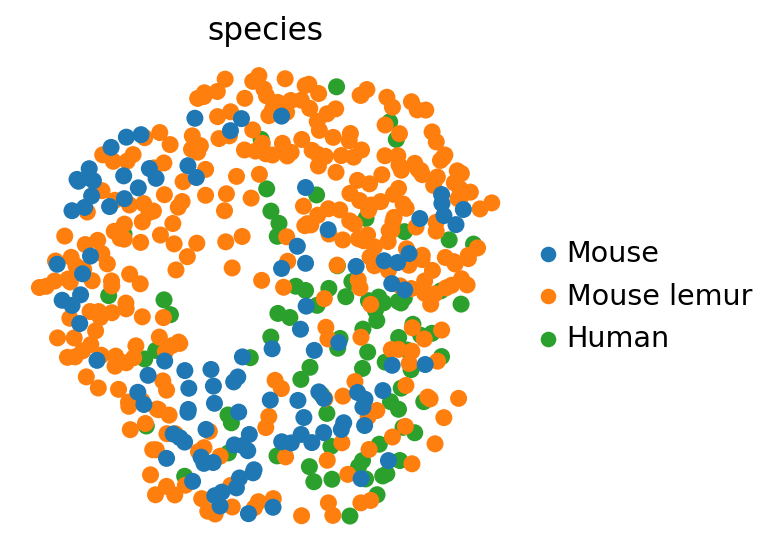


------- group: myeloid: Macrophage -------
number of cells: 18720
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2664
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:05)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


... storing 'compartment_narrow' as categorical


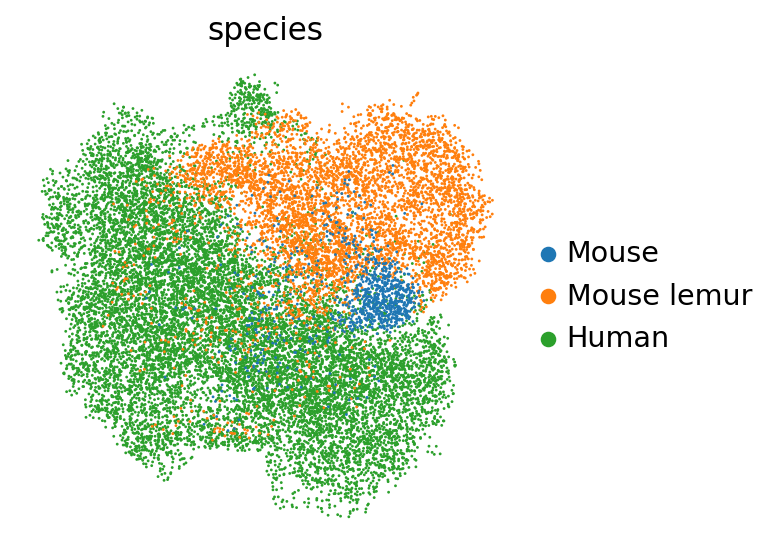


------- group: myeloid: Monocyte -------
number of cells: 5892
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2435
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


... storing 'compartment_narrow' as categorical


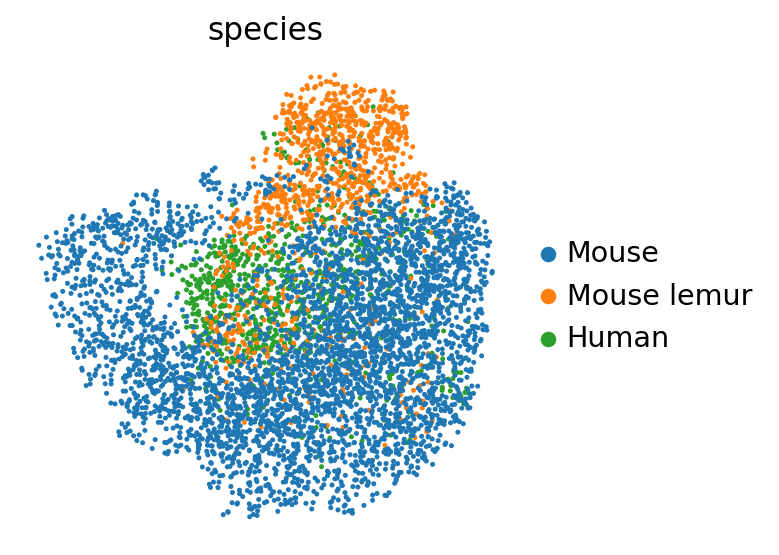


------- group: myeloid: Myeloid Dendritic -------
number of cells: 650
extracting highly variable genes
Scanpy had an error when computing highly variable genes, using previous ones
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:05)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


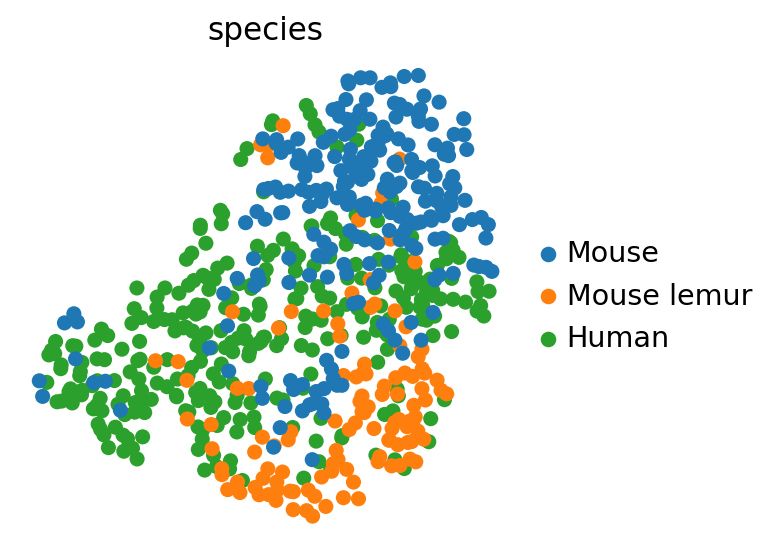


------- group: myeloid: Proliferating Macrophage -------
number of cells: 749
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2678
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


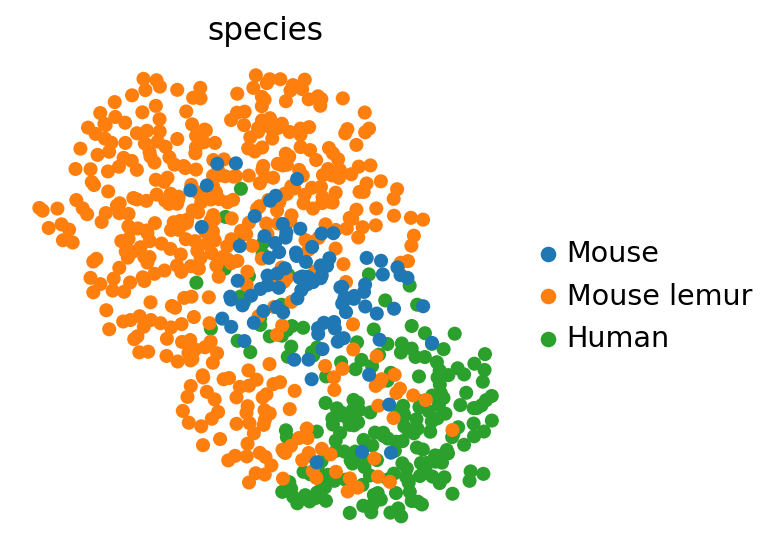


------- group: stromal: Adventitial Fibroblast -------
number of cells: 938
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2811
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


... storing 'compartment_narrow' as categorical


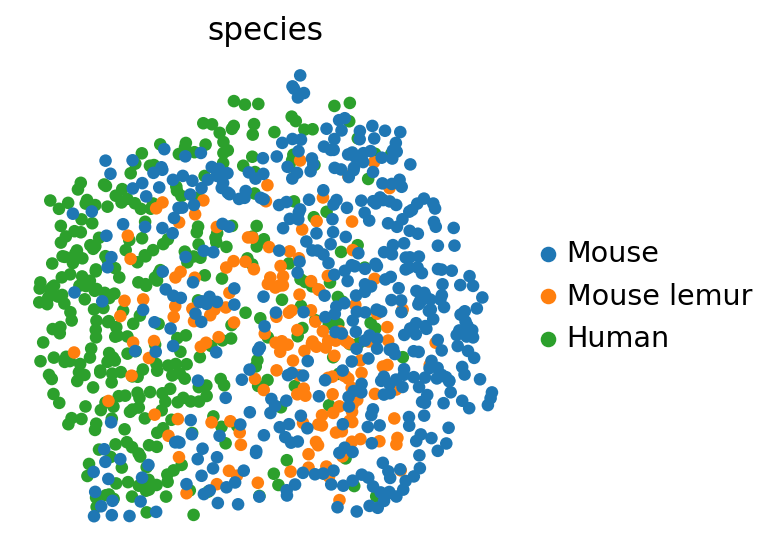


------- group: stromal: Alveolar Fibroblast -------
number of cells: 1713
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, copying.



 Number of highly variable genes: 2648
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


... storing 'compartment_narrow' as categorical


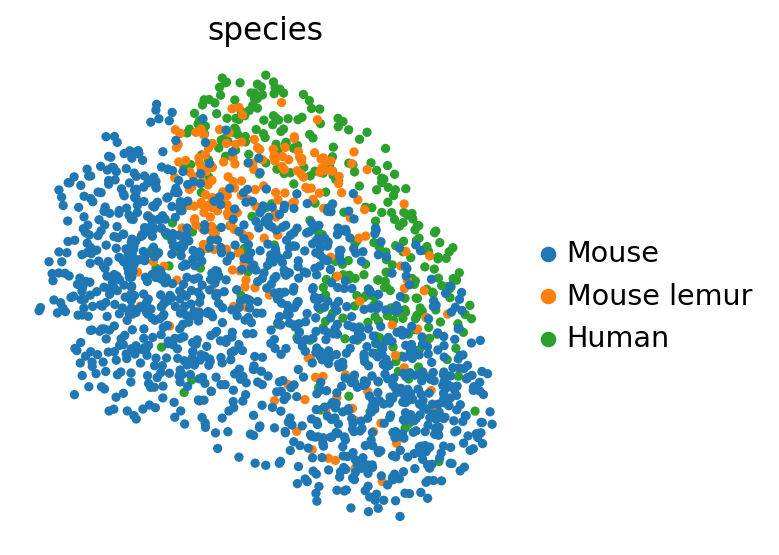

In [9]:
cross_species = xspecies.CrossSpeciesComparison(adata_min_cells, groups_col='compartment_narrow')
cross_species._make_groupby_adatas()

## Run differential expression across all narrow groups


------- group: endothelial: Capillary -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:06)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


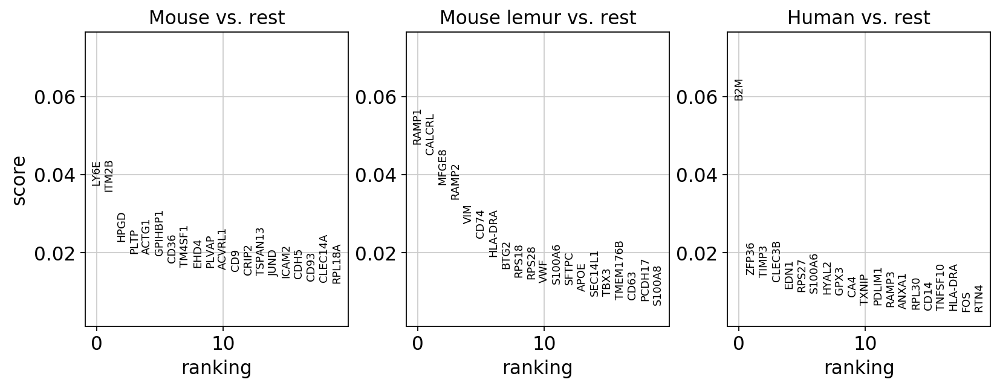


------- group: endothelial: Capillary Aerocyte -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:04)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


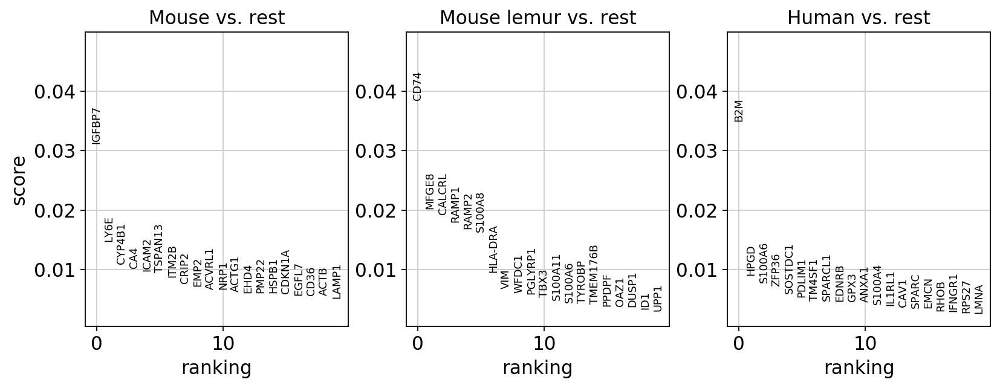


------- group: endothelial: Lymphatic -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


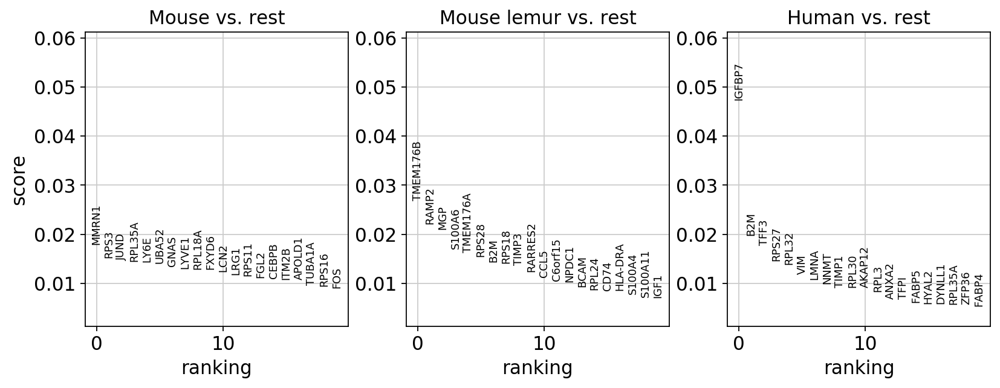


------- group: epithelial: Alveolar Epithelial Type 2 -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:14)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


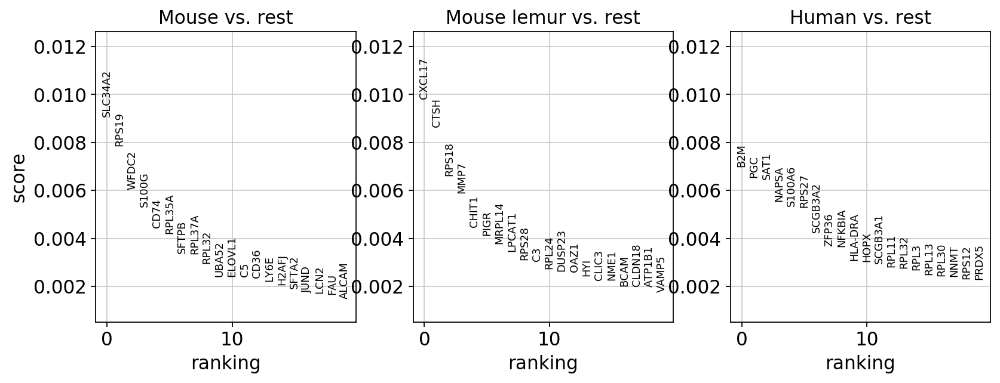


------- group: lymphoid: CD4+ T -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


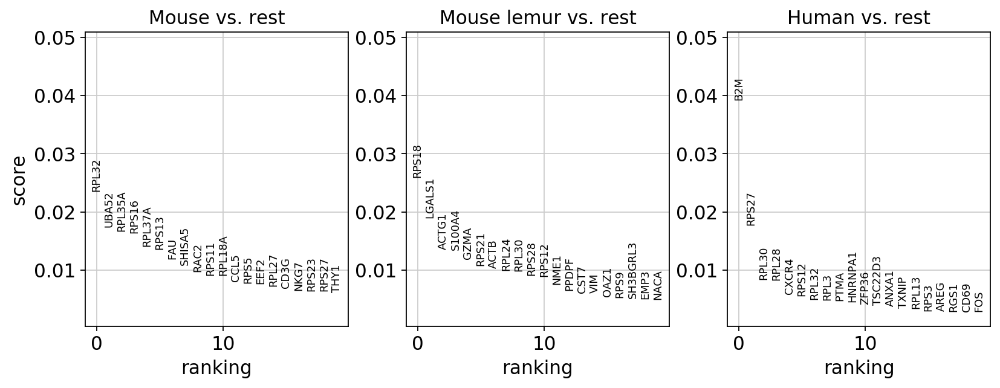


------- group: lymphoid: Natural Killer -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:02)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


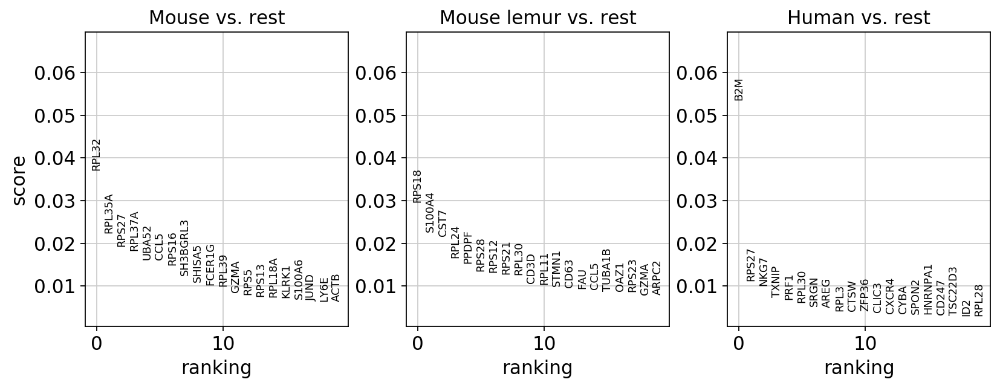


------- group: lymphoid: Plasma -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


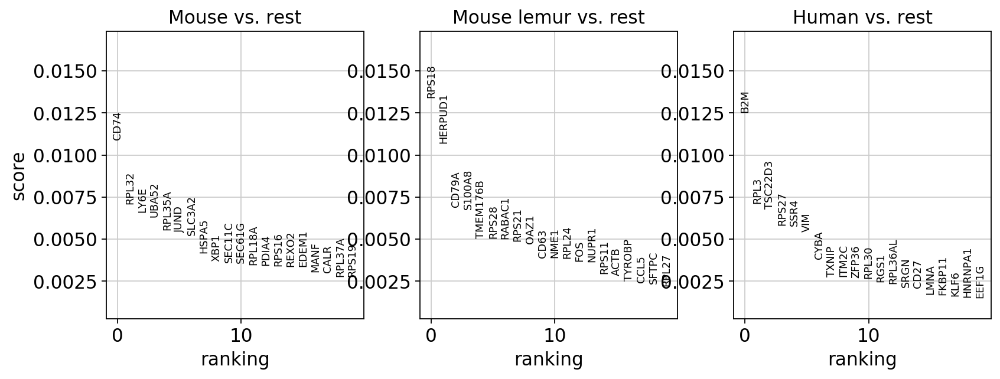


------- group: lymphoid: Proliferating NK/T -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


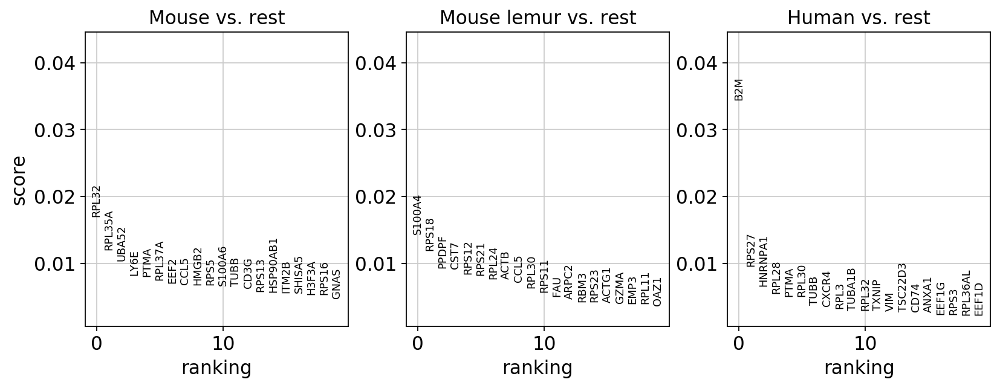


------- group: myeloid: Macrophage -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:24)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


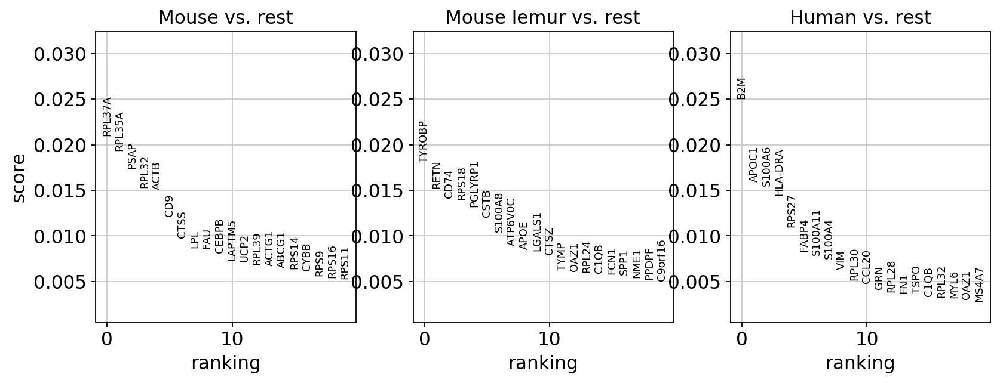


------- group: myeloid: Monocyte -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:18)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


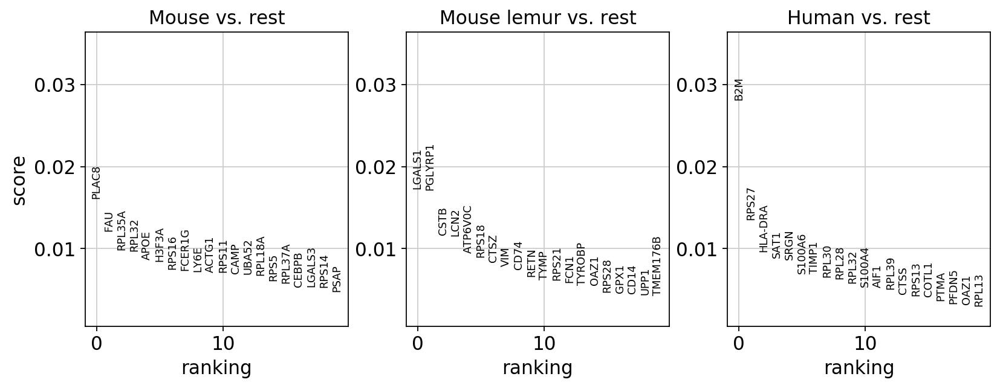


------- group: myeloid: Myeloid Dendritic -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:02)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


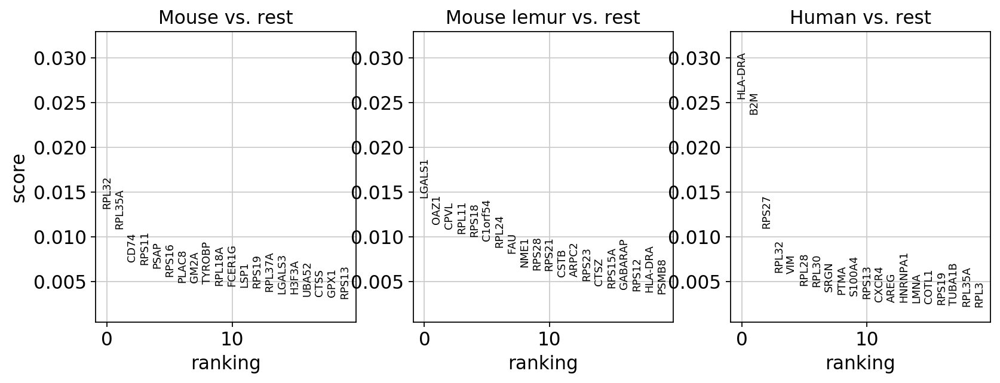


------- group: myeloid: Proliferating Macrophage -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:03)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


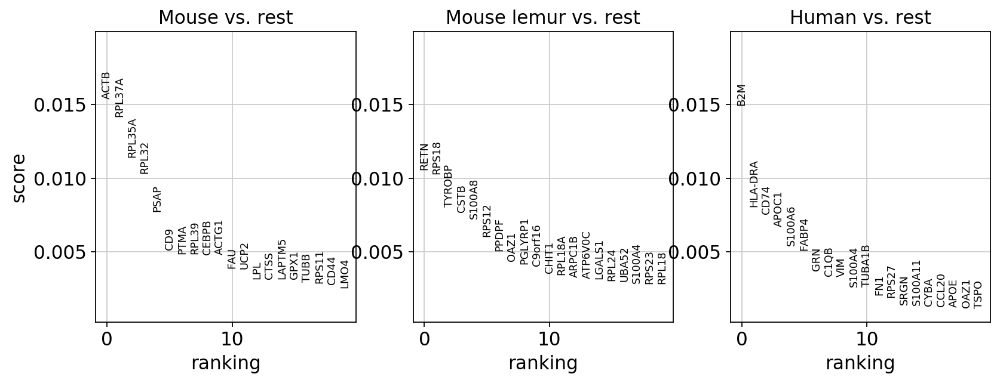


------- group: stromal: Adventitial Fibroblast -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:03)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


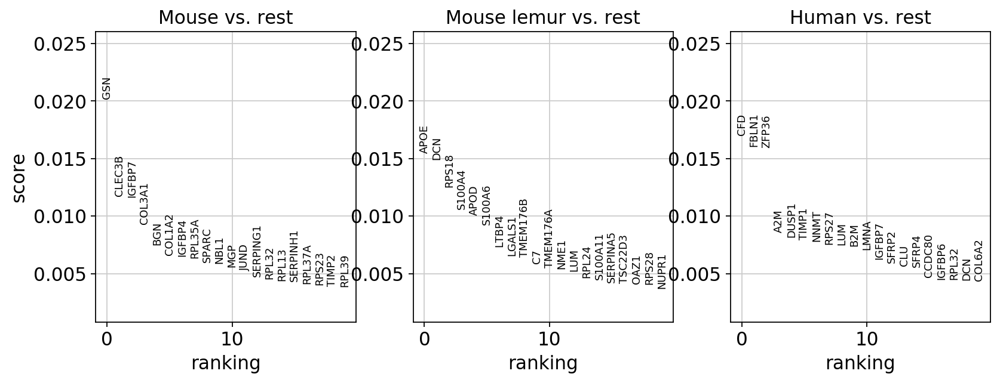


------- group: stromal: Alveolar Fibroblast -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:05)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


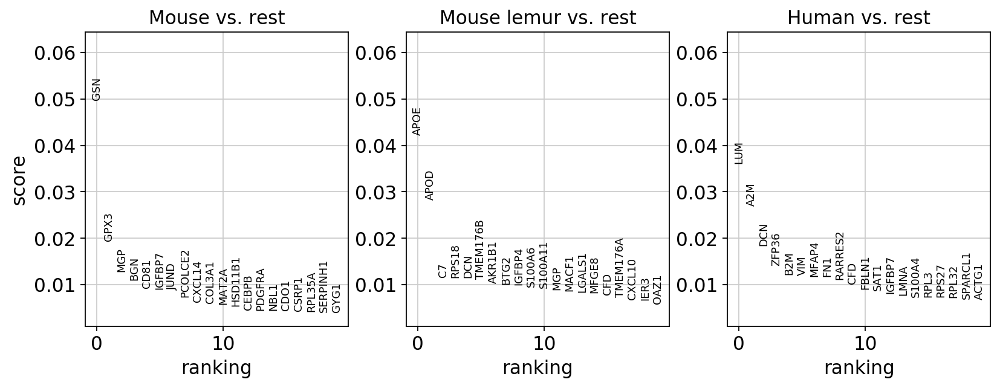

In [10]:
cross_species.do_differential_expression(reference='rest', penalty='l2')

In [ ]:
1+1

## Get mean expression per narrow group

Spearman correlation of sizes vs nonzero: 0.905
Pearson correlation of sizes vs nonzero: 0.615


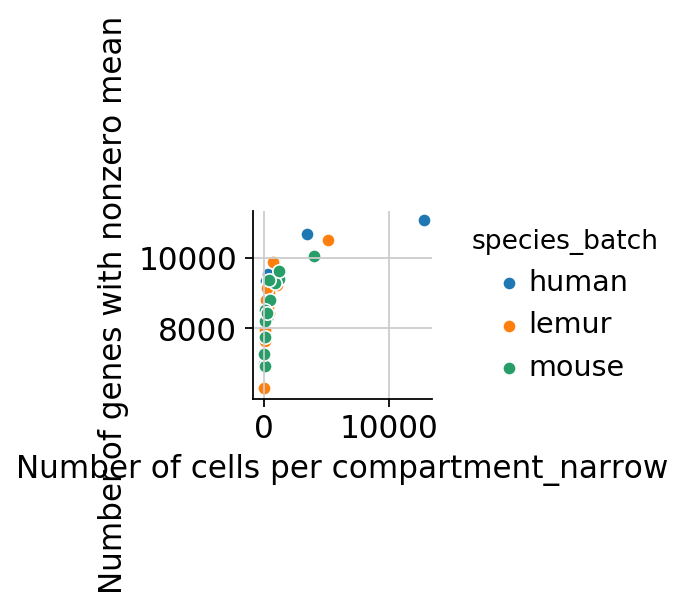

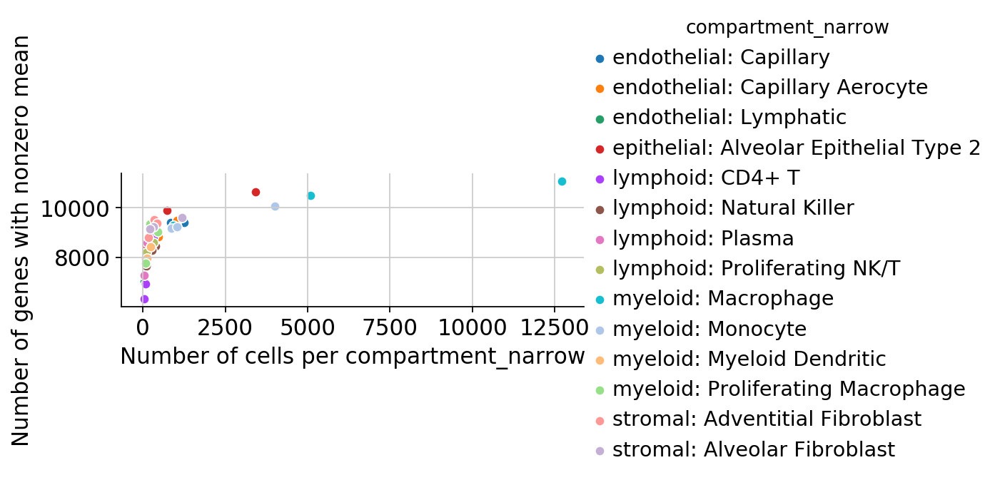

In [11]:
narrow_agg_mean = xspecies.PerGroupAgg(adata_min_cells, group='compartment_narrow', compartment_narrow_separator=": ")
narrow_agg_mean.do_aggregation(aggfunc='mean', plot=True)

Spearman correlation of sizes vs nonzero: 0.164
Pearson correlation of sizes vs nonzero: 0.341


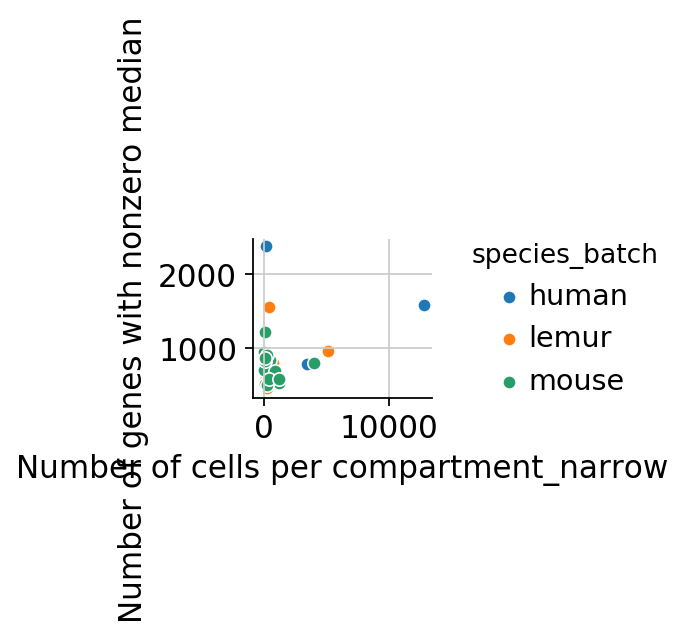

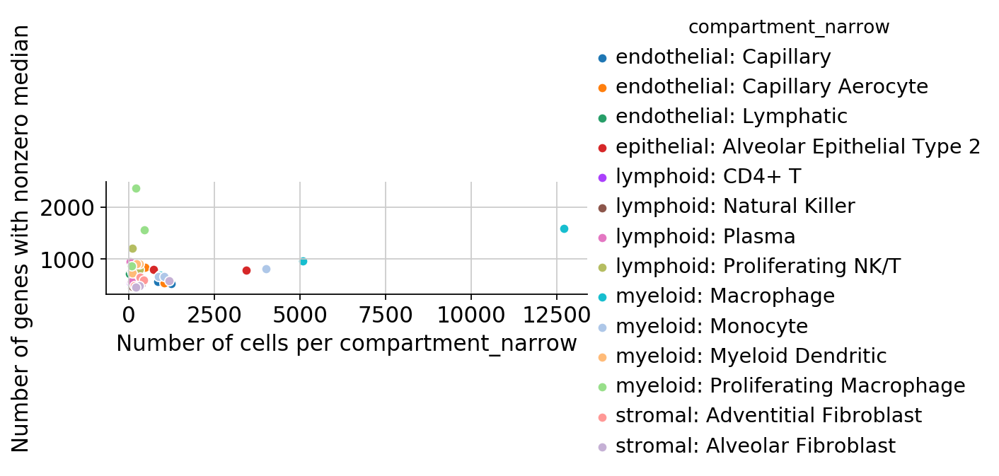

In [12]:
narrow_agg_median = xspecies.PerGroupAgg(adata_min_cells, group='compartment_narrow', compartment_narrow_separator=": ")
narrow_agg_median.do_aggregation(aggfunc=np.median, plot=True, aggfunc_name='median')


# Ternary plots

## Define palettes and functions

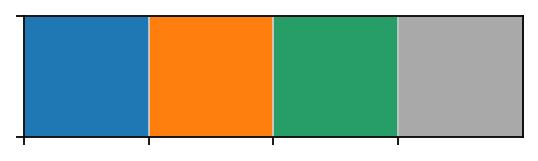

In [39]:
species_to_color = dict(zip(['mouse', 'lemur', 'human'], xspecies.SPECIES_PALETTE))
species_to_color

from matplotlib.colors import rgb2hex

palette = pd.Series({k: rgb2hex(v) for k, v in species_to_color.items()})
palette['not_de'] = 'darkgrey'
sns.palplot(palette)

# def add_de_annotation(data, de_gene_names):
#     data['in_de_gene_names'] = data.index.isin(de_gene_names.values.flatten())
#     data.in_de_gene_names.value_counts()

#     data['de_species'] = 'not_de'

#     for species, col in de_gene_names.iteritems():
#         index = df_nonzero.index.intersection(col.values)
#         data.loc[index, 'de_species'] = species
# #     print(data['de_species'].value_counts())
#     return data

def label_genes(df, de_col, genes):

    df[de_col] = 'not_de'

    for species, col in genes.iteritems():
        index = df.index.intersection(col.dropna().values)
        df.loc[index, de_col] = species
#     print(df[de_col].value_counts())
    return df


    


## Means

In [40]:
narrow_agg_median.aggregated.head()

human                                  \
       endothelial: Capillary endothelial: Capillary Aerocyte   
SAMD11                    0.0                             0.0   
NOC2L                     0.0                             0.0   
KLHL17                    0.0                             0.0   
ISG15                     1.0                             1.0   
AGRN                      0.0                             0.0   

                                                                      \
       endothelial: Lymphatic epithelial: Alveolar Epithelial Type 2   
SAMD11                    0.0                                    0.0   
NOC2L                     0.0                                    0.0   
KLHL17                    0.0                                    0.0   
ISG15                     0.0                                    0.0   
AGRN                      0.0                                    0.0   

                                                                   \
       lymphoid: CD4+ T lymphoid: Natural Killer lymphoid: Plasma   
SAMD11              0.0                      0.0              0.0   
NOC2L               0.0                      0.0              0.0   
KLHL17              0.0                      0.0              0.0   
ISG15               1.0                      0.0              0.0   
AGRN                0.0                      0.0              0.0   

                                                                           \
       lymphoid: Proliferating NK/T myeloid: Macrophage myeloid: Monocyte   
SAMD11                          0.0                 0.0               0.0   
NOC2L                           0.0                 0.0               0.0   
KLHL17                          0.0                 0.0               0.0   
ISG15                           1.0                 4.0               1.0   
AGRN                            0.0                 0.0               0.0   

                                                                     \
       myeloid: Myeloid Dendritic myeloid: Proliferating Macrophage   
SAMD11                        0.0                               0.0   
NOC2L                         0.0                               0.0   
KLHL17                        0.0                               0.0   
ISG15                         0.5                               4.0   
AGRN                          0.0                               0.0   

                                                                     \
       stromal: Adventitial Fibroblast stromal: Alveolar Fibroblast   
SAMD11                             0.0                          0.0   
NOC2L                              0.0                          0.0   
KLHL17                             0.0                          0.0   
ISG15                              0.0                          0.0   
AGRN                               0.0                          0.0   

                        lemur                                  \
       endothelial: Capillary endothelial: Capillary Aerocyte   
SAMD11                    0.0                             0.0   
NOC2L                     0.0                             0.0   
KLHL17                    0.0                             0.0   
ISG15                     0.0                             0.0   
AGRN                      0.0                             0.0   

                                                                      \
       endothelial: Lymphatic epithelial: Alveolar Epithelial Type 2   
SAMD11                    0.0                                    0.0   
NOC2L                     0.0                                    0.0   
KLHL17                    0.0                                    0.0   
ISG15                     0.0                                    0.0   
AGRN                      0.0                                    0.0   

                                                                   \
       lympho

In [41]:
def process_df(df, scale=True, transform='log'):
    df_nonzero = df.loc[(df > 0).any(axis=1)]
    if isinstance(df.columns, pd.MultiIndex):
        df_nonzero.columns = df_nonzero.columns.droplevel(-1)
    if transform == 'log':
        df_nonzero = np.log10(df_nonzero + 1)
    elif transform == 'sqrt':
        df_nonzero = np.sqrt(df_nonzero)
        
    if scale:
        df_nonzero = df_nonzero.divide(df_nonzero.sum(axis=1), axis=0)
#     print(df_nonzero.shape)
    return df_nonzero



## Ternary plot on all cell types

In [49]:
import binarized

/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/ipykernel_launcher.py:128: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:31: RuntimeWarning: invalid value encountered in greater
  x_in = np.logical_and(x>x1, x<x2)
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:31: RuntimeWarning: invalid value encountered in less
  x_in = np.logical_and(x>x1, x<x2)
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:32: RuntimeWarning: invalid value encountered in greater
  y_in = np.logical_and(y>y1, y<y2)
/home/olga/miniconda3/envs/tabula-microcebus-

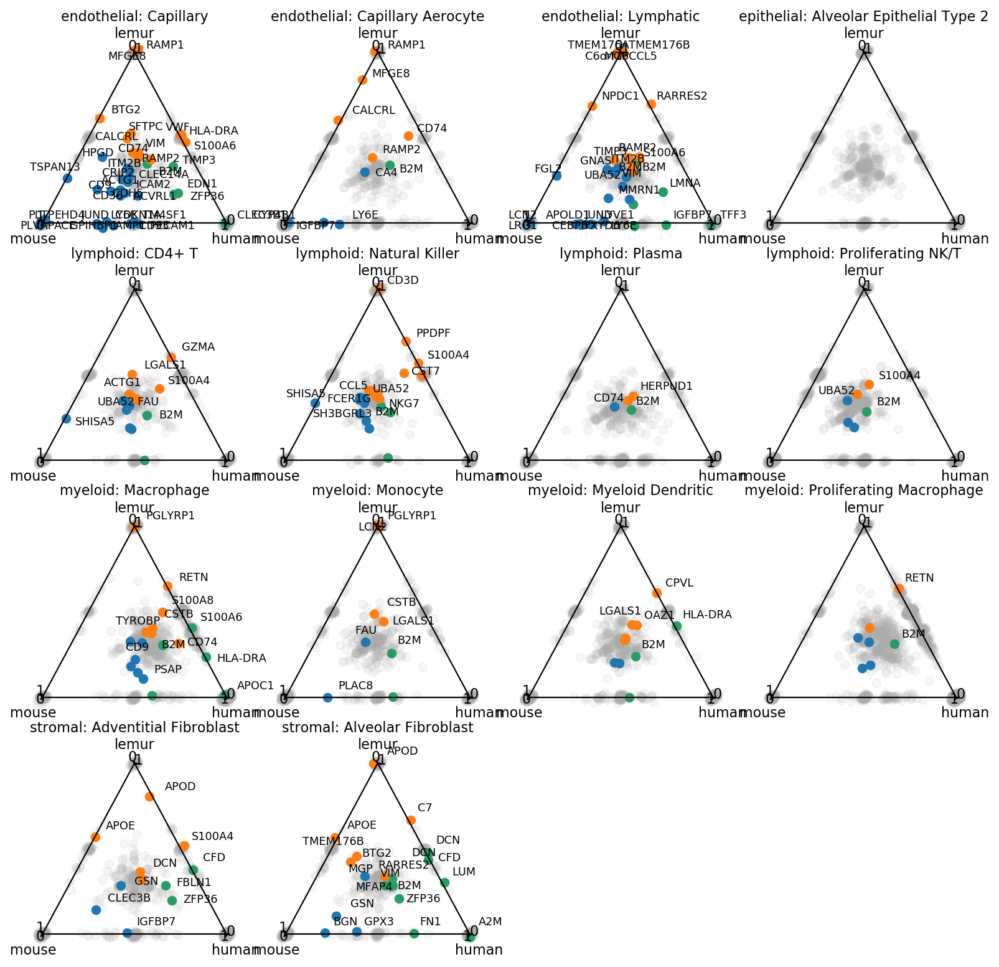

In [145]:
np.random.seed(0)

def do_jitter(data, scale=0.01):
    return data + np.random.normal(scale=scale, size=data.shape)


def threewayplot(data, data_for_coloring=None, groupby=None, palette=None,
                 title=None, jitter=False, alpha=0.5, color=None, **kwargs):
    if jitter:
        data = do_jitter(data)

    data_as_list = data.values
    
    if 'ax' in kwargs:
        made_new_figure = False
        ax = kwargs.pop('ax')
        tax = ternary.TernaryAxesSubplot(ax)
    else:
        made_new_figure = True
        fig, tax = ternary.figure()
    tax.scatter(data_as_list, alpha=alpha, color=color, **kwargs)
    tax.set_title(title + '\n', fontsize=10)
    tax.boundary(linewidth=1.0)
    
    corner_offset = 0.001
    tax.right_corner_label(data.columns[0], offset=corner_offset, fontsize=10)
    tax.top_corner_label(data.columns[1], fontsize=10)
    tax.left_corner_label(data.columns[2], offset=corner_offset, fontsize=10)
    if data_for_coloring is not None:
        for name, df in data_for_coloring.groupby(groupby):
            if name == 'not_de':
                continue
            data_subset = data.loc[df.index]
            subset_color = palette[name]
            tax.scatter(data_subset.values, alpha=1, color=subset_color, **kwargs)

    tax.ticks()

    tax.get_axes().axis('off')
    tax.clear_matplotlib_ticks()
    if made_new_figure:
        fig.tight_layout()
        
        
genes_to_ignore = r'RPS.+', r'RPL.+', 'ACTB'

def annotate_gene_names(xs, ys, gene_names, **kwargs):
#     mask_x = xs > xmin
#     mask_y = ys > ymin
#     mask = mask_x & mask_y
#     print(mask.sum())
    if 'ax' not in kwargs:
        ax = plt.gca()
    else:
        ax = kwargs.pop('ax')
    
    texts = []
    for x, y, gene_name in zip(xs, ys, gene_names):
        # Ignore some genes
        if any(re.match(x, gene_name) for x in genes_to_ignore):
            continue
        
        text = ax.annotate(
            gene_name, 
            xy=(x, y), xycoords='data',
            xytext=(5, 5), textcoords='offset points',
#             arrowprops=dict(arrowstyle='-', #connectionstyle='angle3'
#                            )
            **kwargs
        )
        texts.append(text)
        
    adjust_text(texts, xs.values, ys.values)
    

def de_ternary_plots(aggregated, mini_adatas):
    de_col = 'diffexpr'
    species_cols = ['human', 'lemur', 'mouse']
    score_min = 0.01
    renamer = dict(zip(xspecies.SPECIES_ORDER, xspecies.SPECIES_BATCH_ORDER))

    nrow, ncol = binarized.get_nrow_ncol(len(mini_adatas))

    figscale = 3
    figwidth = figscale * ncol
    figheight = figscale * nrow
    fig, axes = plt.subplots(nrows=nrow, ncols=ncol, figsize=(figwidth, figheight))

    for (celltype_name, celltype_df), ax in zip(aggregated.groupby(level=1, axis=1), axes.flat):

        celltype_adata = mini_adatas[celltype_name]
    #     logfoldchanges = xspecies.CrossSpeciesComparison.extract_de_logfoldchanges(celltype_adata)
        de_gene_names = xspecies.CrossSpeciesComparison.extract_de_names(celltype_adata)
        de_gene_names = de_gene_names.rename(columns=renamer)

        de_scores = xspecies.CrossSpeciesComparison.extract_de_scores(celltype_adata)
        de_scores = de_scores.rename(columns=renamer)

        mask = de_scores > score_min
        de_gene_names = de_gene_names[mask]

        #     pvals = xspecies.CrossSpeciesComparison.extract_de_pvals_adj(celltype_adata)

        df_nonzero = process_df(celltype_df, transform='log')
#         df_nonzero = add_de_annotation(df_nonzero, de_gene_names)
        df_nonzero = label_genes(df_nonzero, de_col, de_gene_names)

        df_nonzero_data_only = df_nonzero[species_cols]
        de_gene_names_list = [x for x in de_gene_names.dropna(how='all').values.flatten() if not pd.isnull(x)]
    #     print(df_nonzero_data_only_de.shape)
    #     df_nonzero_data_only_de.head()


        threewayplot(
            df_nonzero_data_only, 
            jitter=True, 
            alpha=0.1, 
            color='darkgrey', 
            data_for_coloring=df_nonzero,
            groupby=de_col,
            palette=palette, 
            title=celltype_name,
            ax=ax
        )

        # Add gene names
        if de_gene_names_list:
            df_nonzero_data_only_de = df_nonzero_data_only.loc[de_gene_names_list]
            de_data = df_nonzero_data_only_de.values.tolist()

            # Convert 3-way value into x, y value
            xs, ys = ternary.helpers.project_sequence(de_data)
            annotate_gene_names(pd.Series(xs), pd.Series(ys), pd.Series(de_gene_names_list), ax=ax, fontsize=8)
    #     if celltype_name == "myeloid: Proliferating Macrophage":
    #         break

    binarized.turn_off_empty_axes(axes)
    
de_ternary_plots(narrow_agg_median.aggregated, cross_species.mini_adatas)

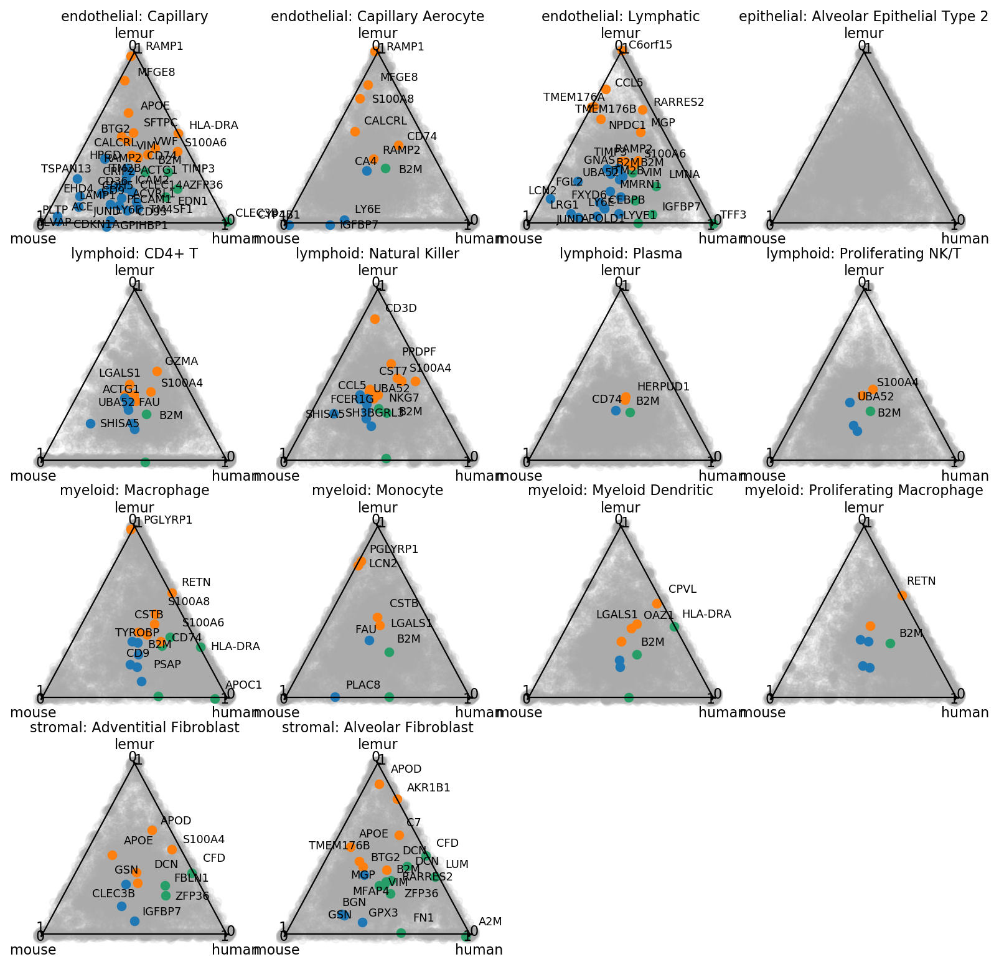

In [142]:
de_ternary_plots(narrow_agg_mean, cross_species.mini_adatas)

Genes that are colored, but aren't labeled, are technical artifact / ribosomal protein genes

## Do differential expression relative to primates


------- group: endothelial: Capillary -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:06)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


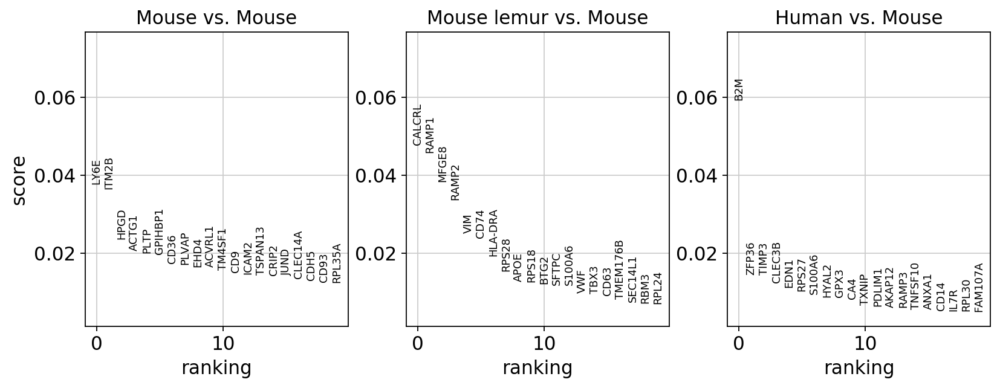


------- group: endothelial: Capillary Aerocyte -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:04)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


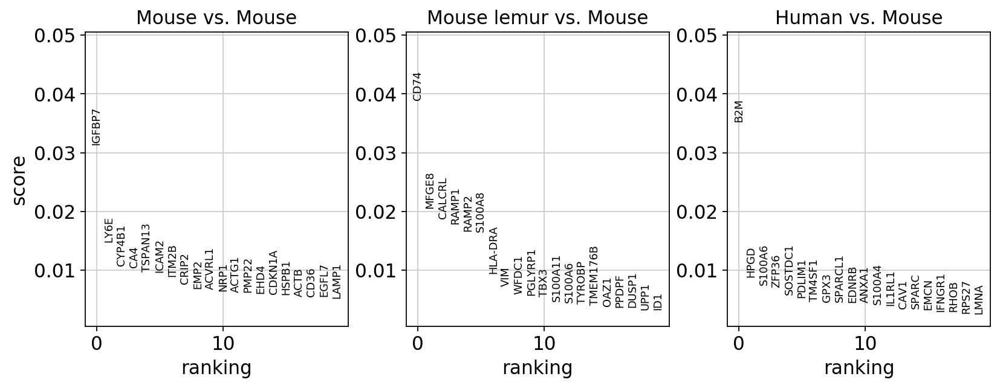


------- group: endothelial: Lymphatic -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


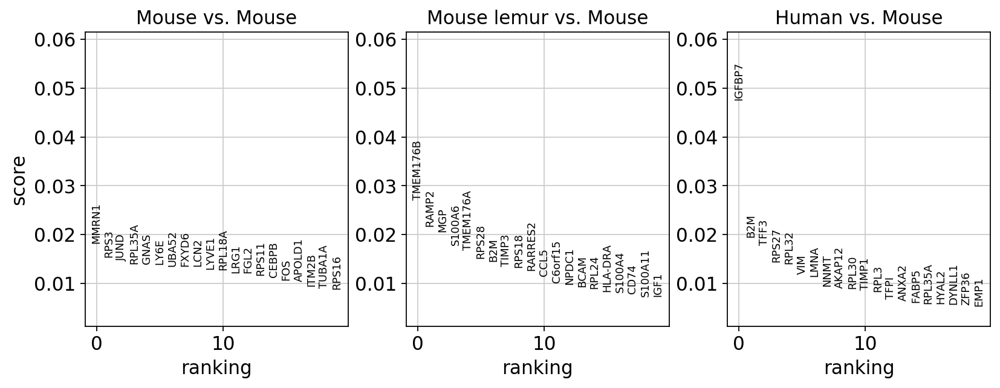


------- group: epithelial: Alveolar Epithelial Type 2 -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:14)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


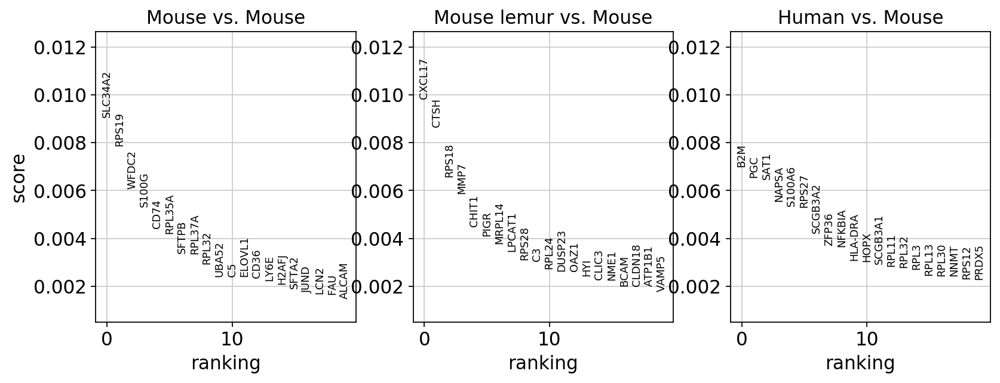


------- group: lymphoid: CD4+ T -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


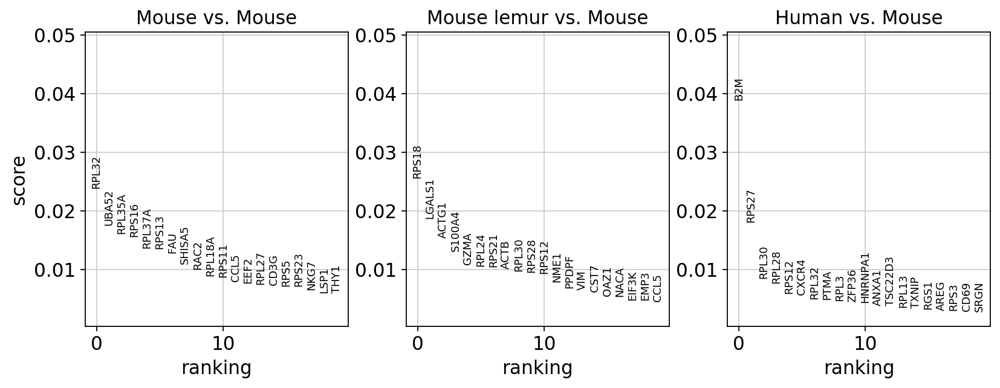


------- group: lymphoid: Natural Killer -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:02)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


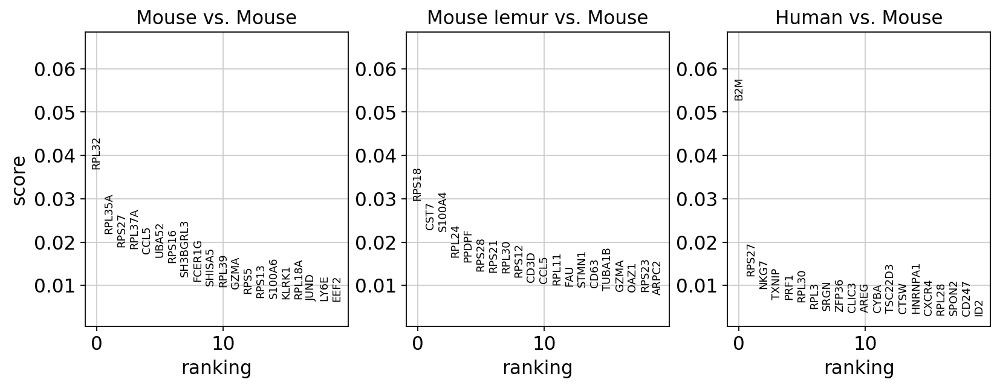


------- group: lymphoid: Plasma -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


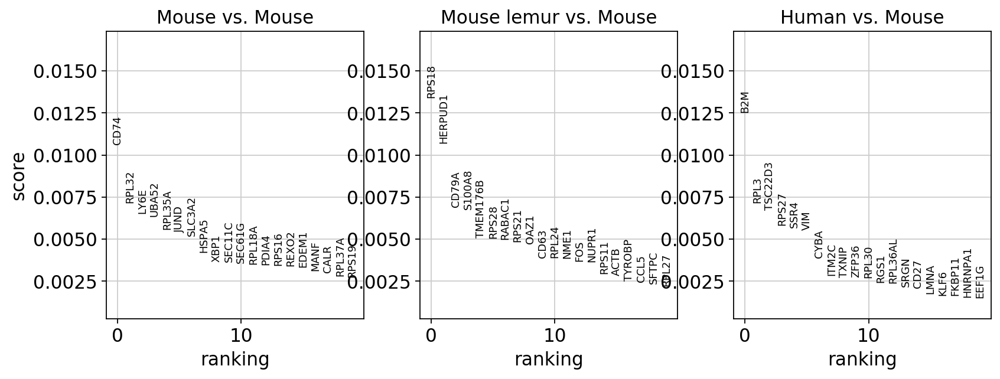


------- group: lymphoid: Proliferating NK/T -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:01)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


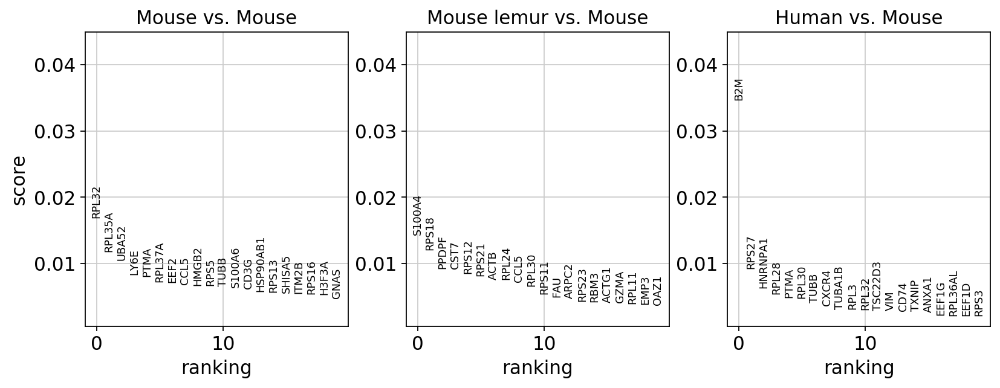


------- group: myeloid: Macrophage -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:24)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


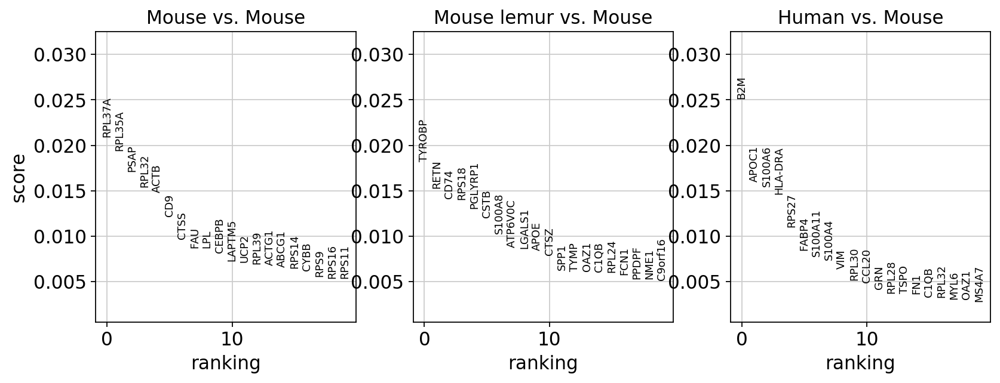


------- group: myeloid: Monocyte -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:18)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


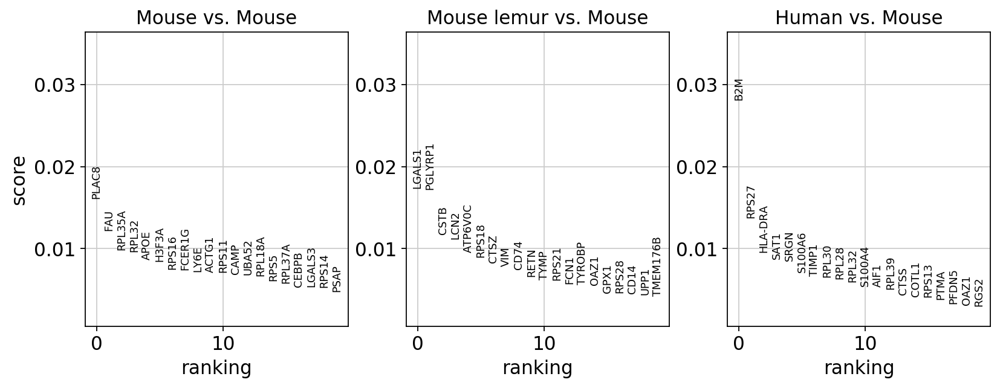


------- group: myeloid: Myeloid Dendritic -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:02)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


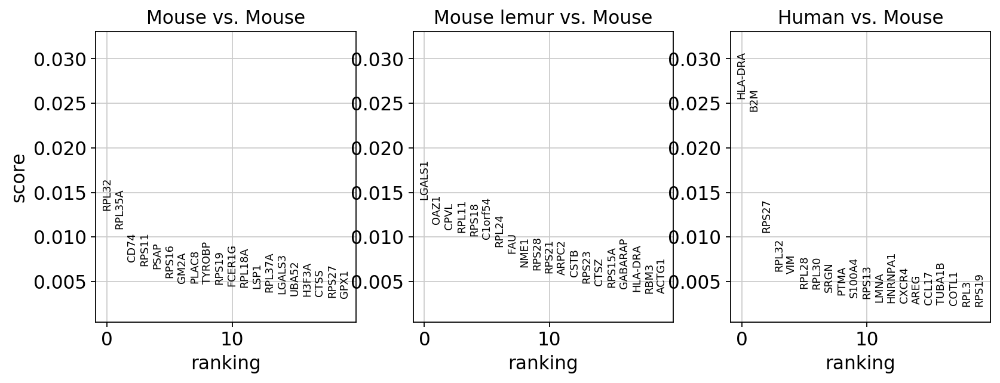


------- group: myeloid: Proliferating Macrophage -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:04)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


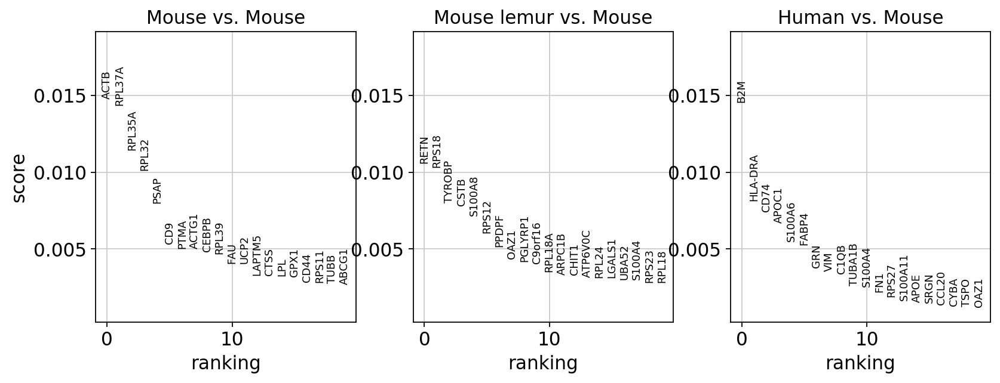


------- group: stromal: Adventitial Fibroblast -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:03)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


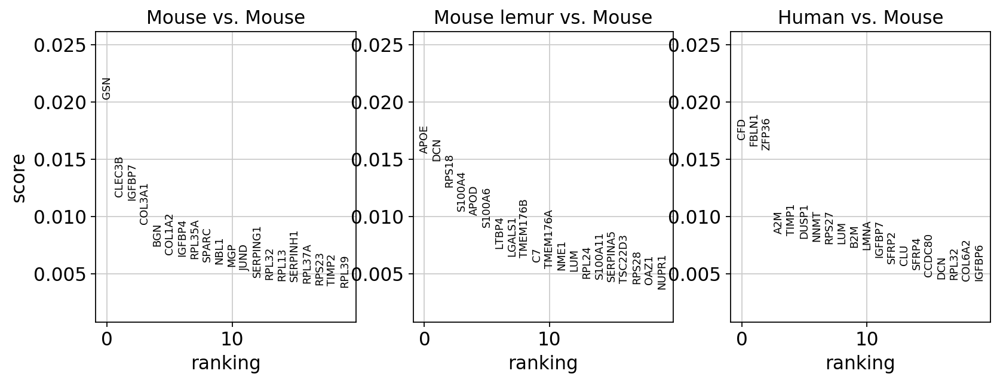


------- group: stromal: Alveolar Fibroblast -------
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:05)


/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


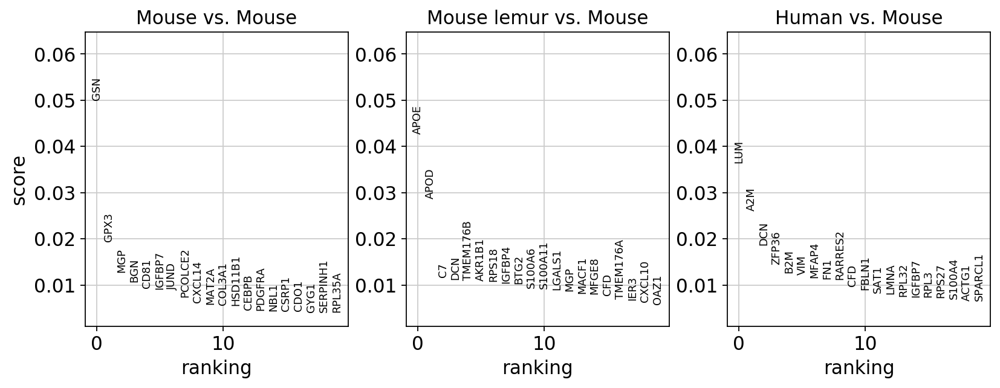

In [147]:
cross_species.do_differential_expression(penalty='l2')

/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/ipykernel_launcher.py:128: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:31: RuntimeWarning: invalid value encountered in greater
  x_in = np.logical_and(x>x1, x<x2)
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:31: RuntimeWarning: invalid value encountered in less
  x_in = np.logical_and(x>x1, x<x2)
/home/olga/miniconda3/envs/tabula-microcebus-v2/lib/python3.7/site-packages/adjustText/__init__.py:32: RuntimeWarning: invalid value encountered in greater
  y_in = np.logical_and(y>y1, y<y2)
/home/olga/miniconda3/envs/tabula-microcebus-

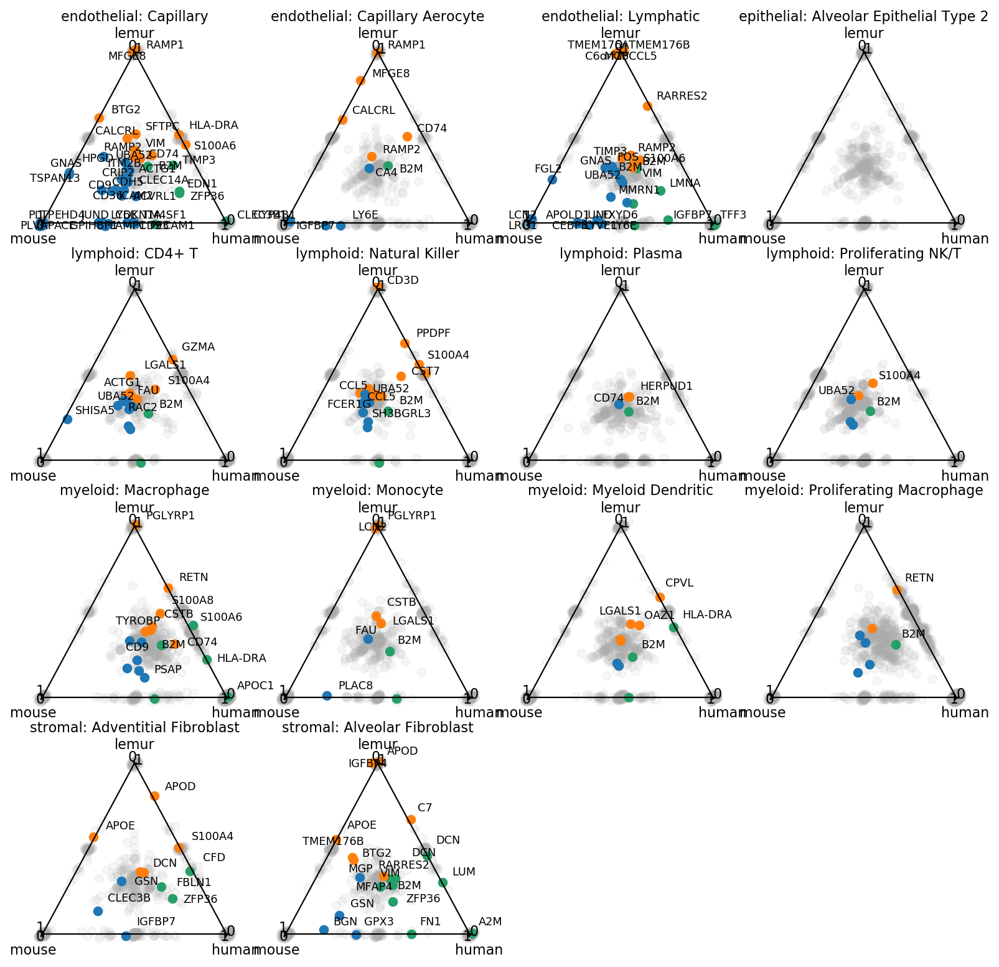

In [148]:
de_ternary_plots(narrow_agg_median.aggregated, cross_species.mini_adatas)

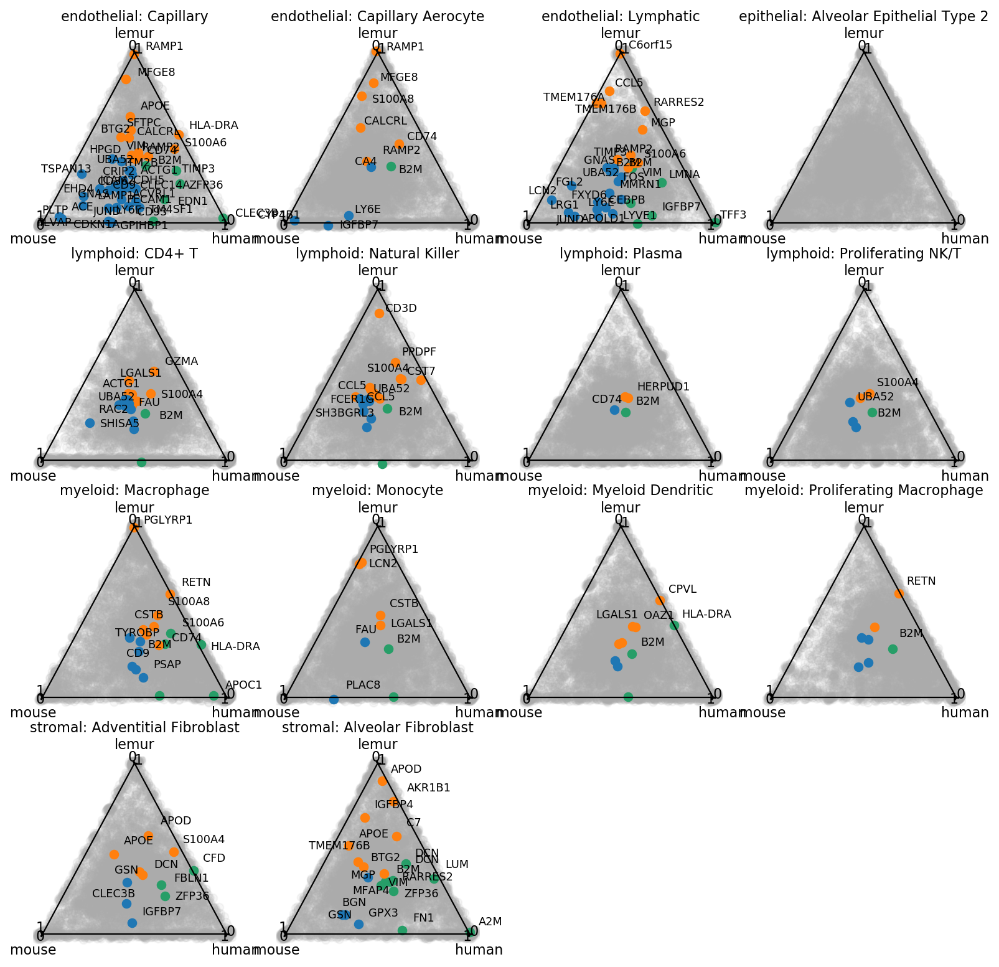

In [149]:
de_ternary_plots(narrow_agg_mean.aggregated, cross_species.mini_adatas)

In [138]:
df_nonzero_data_only_de.shape

(7, 3)

In [137]:
len(xs)

7

In [150]:
# de_gene_name

In [151]:
# df_nonzero_data_only_de 

In [128]:
celltype_df.head()

,human,lemur,mouse
,stromal: Alveolar Fibroblast,stromal: Alveolar Fibroblast,stromal: Alveolar Fibroblast
SAMD11,0.0,0.0,0.0
NOC2L,0.0,0.0,0.0
KLHL17,0.0,0.0,0.0
ISG15,0.0,0.0,0.0
AGRN,0.0,0.0,0.0


In [129]:
celltype_df.loc['AKR1B1']

human  stromal: Alveolar Fibroblast    0.0
lemur  stromal: Alveolar Fibroblast    0.0
mouse  stromal: Alveolar Fibroblast    0.0
Name: AKR1B1, dtype: float32

In [152]:
import ternary
import random

# Generate Data
def random_points(num_points=25, scale=40):
    points = []
    for i in range(num_points):
        x = random.randint(1, scale)
        y = random.randint(0, scale - x)
        z = scale - x - y
        points.append((x,y,z))
    return points


### Scatter Plot
scale = 40
fig, ax = plt.subplots()
tax = ternary.TernaryAxesSubplot(ax)
points = random_points(10, scale=scale)
tax.scatter(points, marker='D', color='green', label="Green Diamonds")

# Add text annotation
xs, ys = ternary.helpers.project_sequence(points)
for x, y in zip(xs, ys):
    text = ax.annotate(
        'green', 
        xy=(x, y), xycoords='data',
        xytext=(5, 5), textcoords='offset points',
#             arrowprops=dict(arrowstyle='-', connectionstyle='angle3')
    )


tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')
tax.show()